

---


**PREDICTING BIRD SPECIES WITH ANN AND CNN TECHNIQUES**

---


**AIM:** To build and compare artificial neural network (ANN) and convolutional neural network (CNN) models for the classification and prediction of bird species using image data.



---


---





LOADING THE DATASET





In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/Birds_Data.zip' -d '/content/drive/MyDrive'

Archive:  /content/drive/MyDrive/Birds_Data.zip
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/001.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/002.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/003.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/004.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/005.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/006.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/007.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/008.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/009.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/010.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/011.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/012.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/013.jpg  
  inflating: /content/drive/MyDrive/AMERICAN GOLDFINCH/014.jpg  
  inflating: /content/drive/MyDrive/AMERIC

IMPORTING NECESSARY LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
from matplotlib.image import imread
import cv2
import random
from os import listdir
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array, array_to_img
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation,Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import callbacks

PLOTTING VISUALIZATIONS

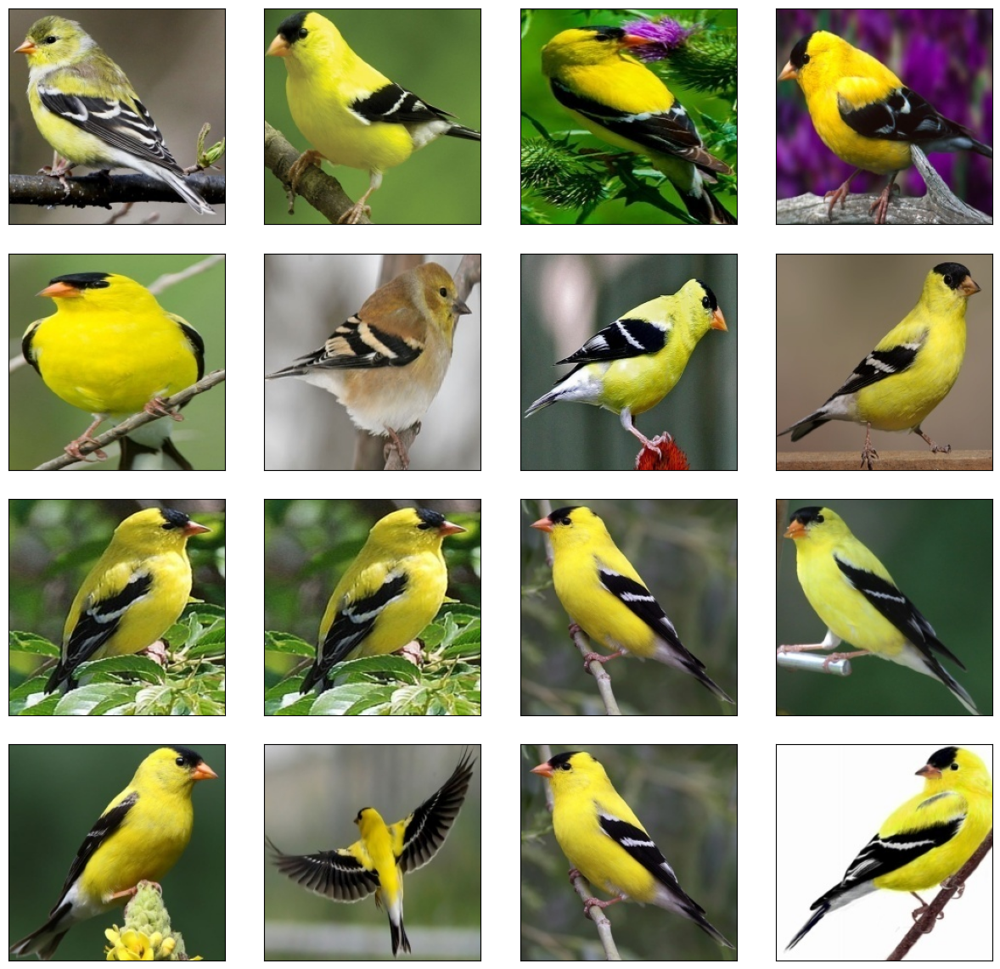

In [ ]:
plt.figure(figsize=(12,12))
for i in range(1,17):
    path='/content/drive/MyDrive/AMERICAN GOLDFINCH'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

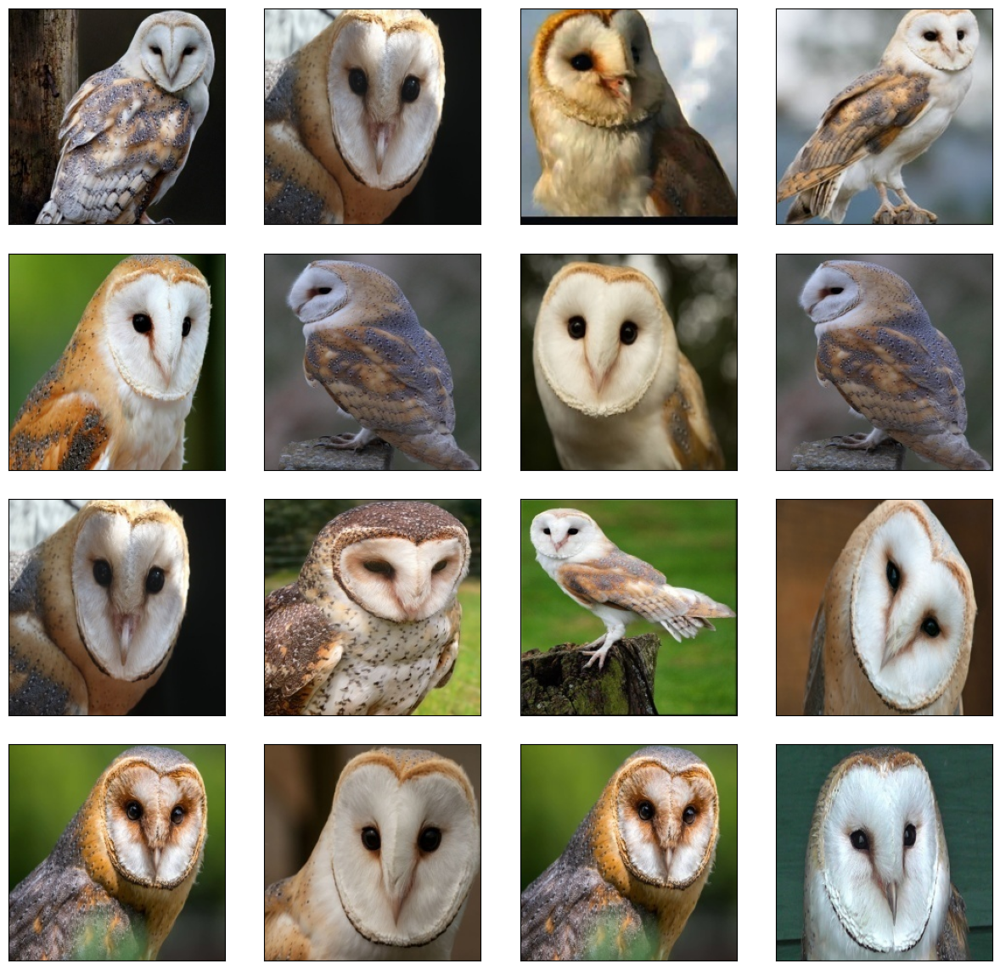

In [ ]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    path='/content/drive/MyDrive/BARN OWL'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

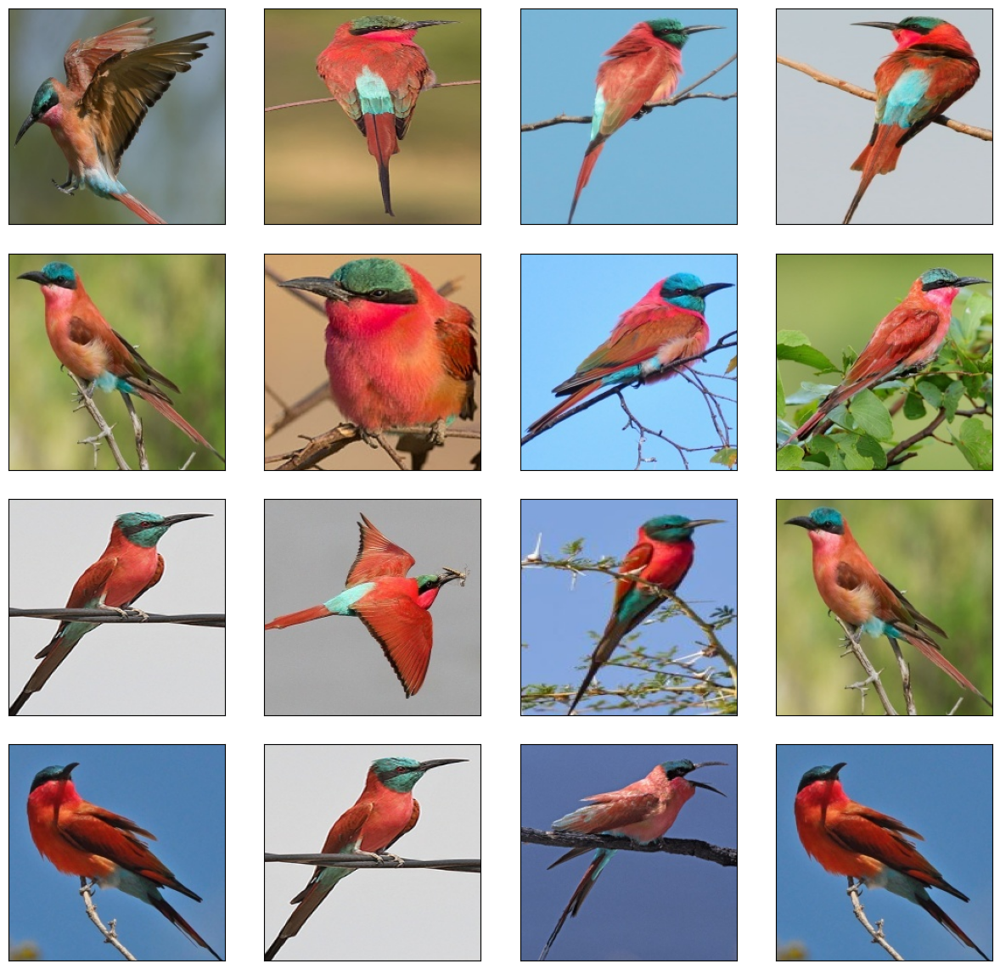

In [ ]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    path='/content/drive/MyDrive/CARMINE BEE-EATER'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

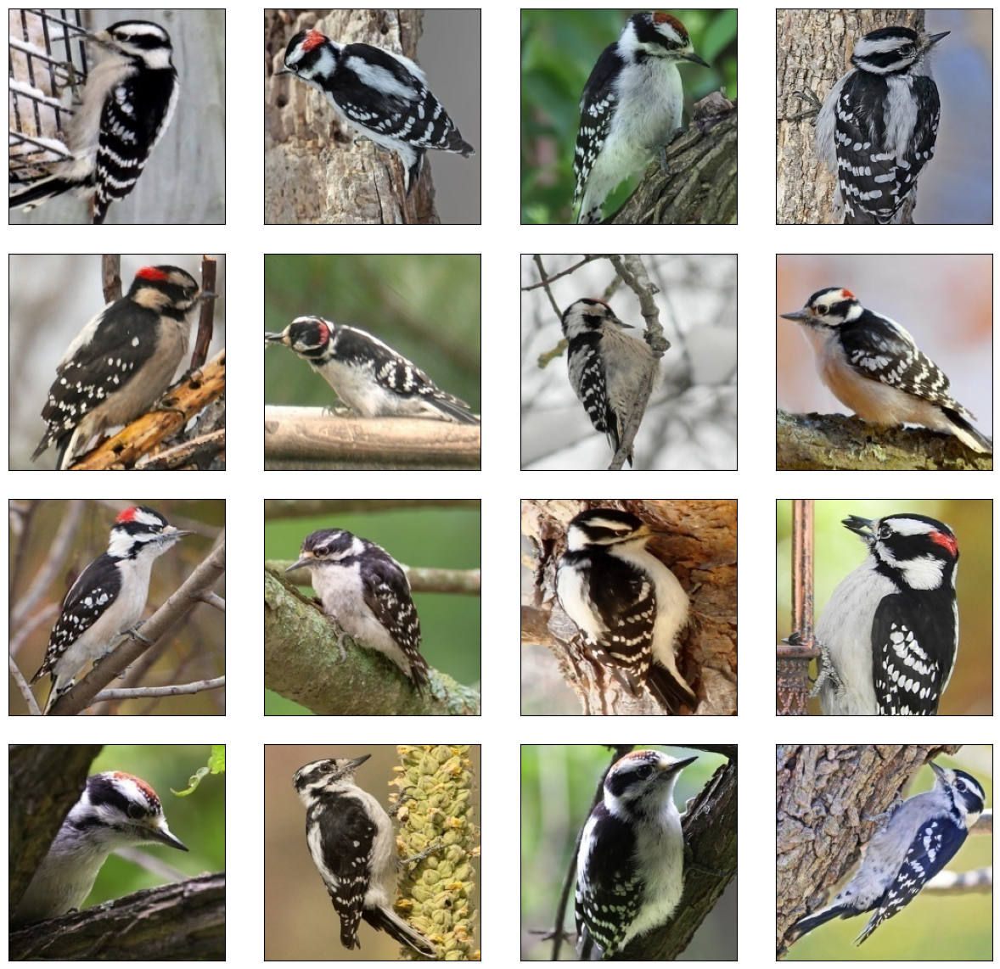

In [ ]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    path='/content/drive/MyDrive/DOWNY WOODPECKER'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

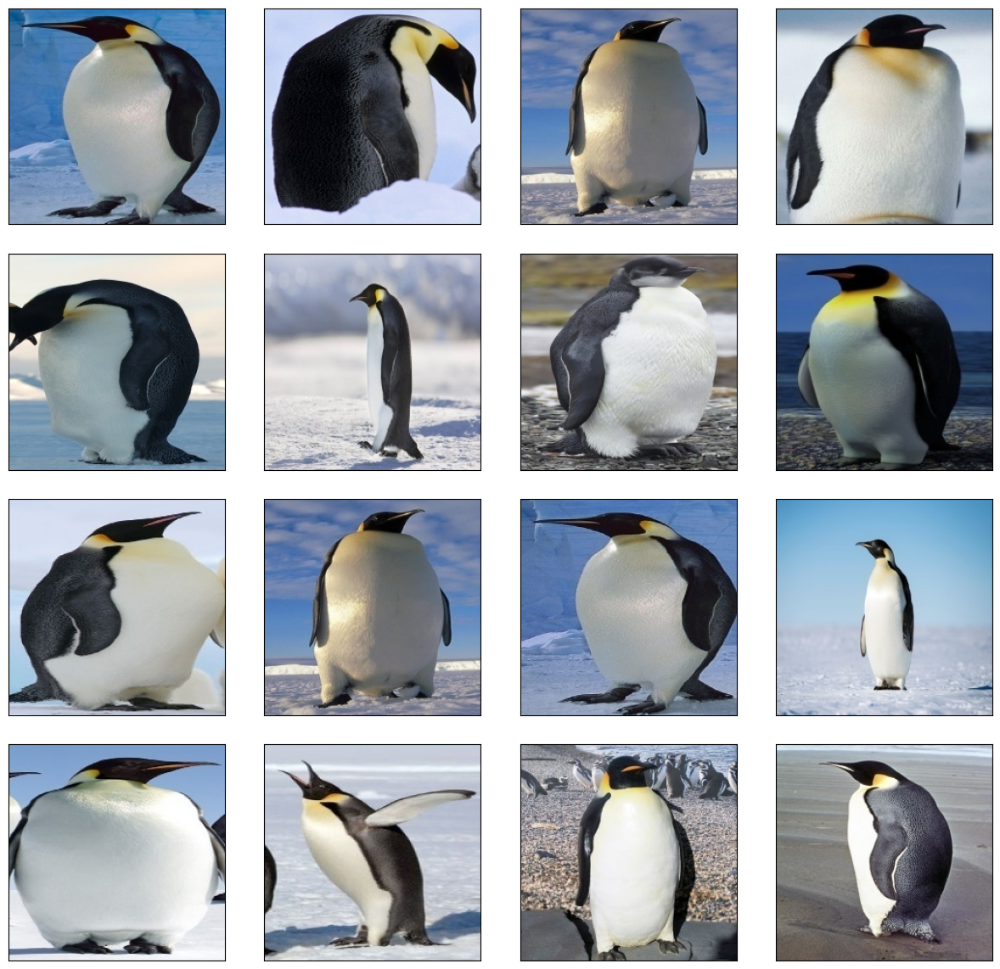

In [ ]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    path='/content/drive/MyDrive/EMPEROR PENGUIN'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

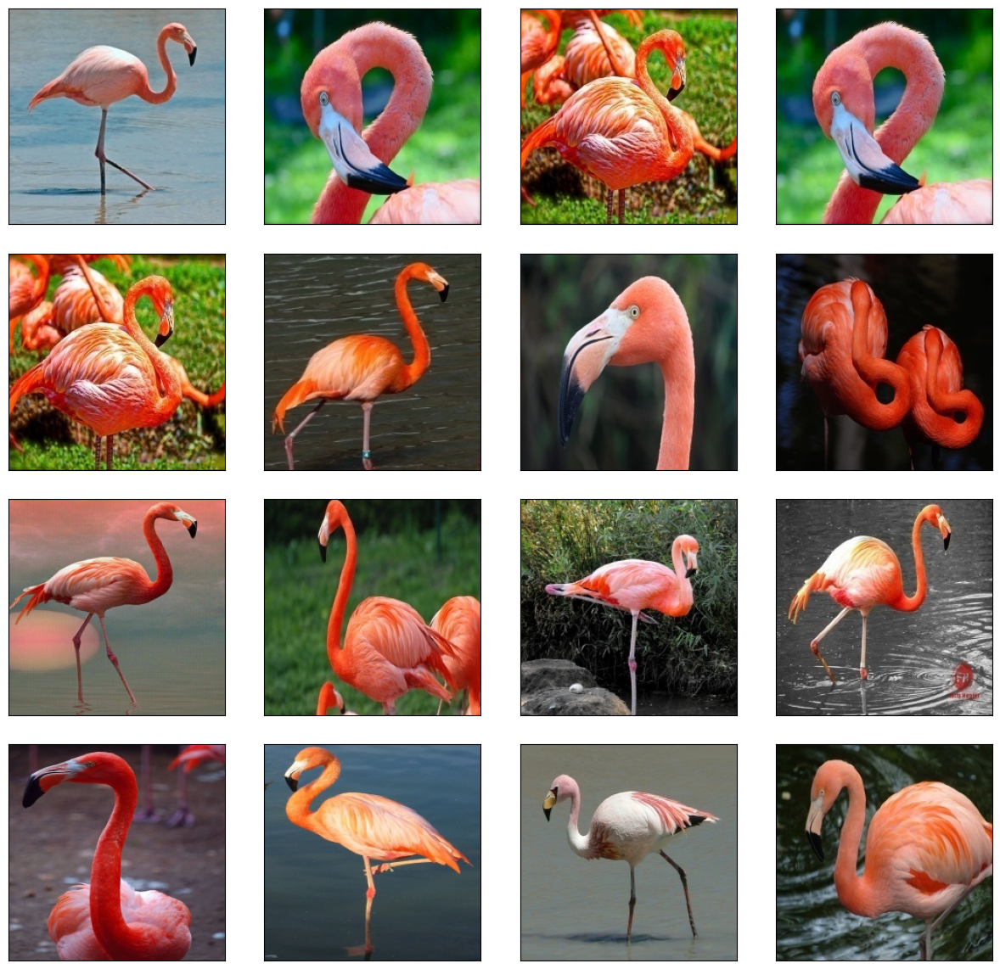

In [ ]:
plt.figure(figsize=(12,12))

for i in range(1,17):
    path='/content/drive/MyDrive/FLAMINGO'
    plt.subplot(4,4,i)
    plt.tight_layout()
    ramd_img=imread(path +'/'+random.choice(sorted(listdir(path))))
    plt.imshow(ramd_img)
    plt.xticks([])
    plt.yticks([])

IMAGE DATA PRE - PROCESSING AND LOADING

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# PARAMETERS
image_size = (128, 128)  # Resize all images
batch_size = 32
data_dir = '/content/drive/MyDrive/Birds'

# IMAGE GENERATOR
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# TRAINING AND VALIDATION SETS
train_data = datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_data = datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)
num_classes = train_data.num_classes


Found 652 images belonging to 6 classes.
Found 159 images belonging to 6 classes.


MODEL BUILDING - 1] ANN

In [ ]:
from tensorflow.keras import layers, models
ann_model = models.Sequential([
    layers.Flatten(input_shape=(128, 128, 3)),
    layers.Dense(256, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
ann_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
ann_model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 49152)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    12,583,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,616,838 (48.13 MB)

 Trainable params: 12,616,838 (48.13 MB)

 Non-trainable params: 0 (0.00 B)

MODEL BUILDING - 2] CNN

In [ ]:
cnn_model = models.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
cnn_model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 57600)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │     7,372,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,393,094 (28.20 MB)

 Trainable params: 7,393,094 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

MODEL TRAINING - 1] ANN (EPOCHS TRAINED: 10)

In [ ]:
# ANN MODEL
ann_history = ann_model.fit(train_data, validation_data=val_data, epochs=10)

Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 328ms/step - accuracy: 0.8264 - loss: 0.5438 - val_accuracy: 0.6226 - val_loss: 1.1060
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 340ms/step - accuracy: 0.7977 - loss: 0.6607 - val_accuracy: 0.5912 - val_loss: 1.5443
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 321ms/step - accuracy: 0.7823 - loss: 0.8326 - val_accuracy: 0.5975 - val_loss: 1.6209
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 10s 302ms/step - accuracy: 0.8861 - loss: 0.3213 - val_accuracy: 0.6667 - val_loss: 0.9881
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 8s 382ms/step - accuracy: 0.8849 - loss: 0.3590 - val_accuracy: 0.6415 - val_loss: 1.2199
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 299ms/step - accuracy: 0.8753 - loss: 0.3494 - val_accuracy: 0.7170 - val_loss: 0.9127
Epoch 7/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 8s 385ms/step - accuracy: 0.9507 - loss: 0.1556 - val_accuracy: 0.6792 - val_loss: 1.0136
Epoch 8/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 306ms/step - accuracy: 0.9266 - loss: 0.2104 - val_accuracy: 0

MODEL TRAINING - 2] CNN (EPOCHS TRAINED: 10)

In [ ]:
# CNN MODEL
cnn_history = cnn_model.fit(train_data, validation_data=val_data, epochs=10)

Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 20s 954ms/step - accuracy: 0.9881 - loss: 0.0723 - val_accuracy: 0.8994 - val_loss: 0.3236
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 19s 867ms/step - accuracy: 0.9927 - loss: 0.0271 - val_accuracy: 0.8616 - val_loss: 0.4155
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 884ms/step - accuracy: 1.0000 - loss: 0.0167 - val_accuracy: 0.8994 - val_loss: 0.2866
Epoch 4/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 19s 918ms/step - accuracy: 1.0000 - loss: 0.0043 - val_accuracy: 0.9119 - val_loss: 0.2982
Epoch 5/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 21s 924ms/step - accuracy: 1.0000 - loss: 0.0027 - val_accuracy: 0.9119 - val_loss: 0.2919
Epoch 6/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 859ms/step - accuracy: 1.0000 - loss: 0.0025 - val_accuracy: 0.9119 - val_loss: 0.2968
Epoch 7/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 20s 954ms/step - accuracy: 1.0000 - loss: 0.0016 - val_accuracy: 0.9119 - val_loss: 0.3025
Epoch 8/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 19s 876ms/step - accuracy: 1.0000 - loss: 0.0013 - val_accu



---


CONCLUSION:


---


1] The CNN model significantly outperformed the ANN model, both in accuracy and stability.

2] CNN shows strong generalization to the validation set, indicating it's a better fit for image-based classification tasks due to its ability to extract spatial features.

3] ANN suffers from overfitting and inconsistent validation performance, which is expected since ANN lacks the architectural strengths of CNN for image data.